In [1]:
import os
import sys

import numpy as np
np.random.seed(42)
import pandas as pd

import scvelo as scv
import scanpy as sc

from scipy import sparse
from scipy import stats
from statsmodels.stats.multitest import multipletests

import seaborn as sns
from matplotlib import pyplot as plt
import matplotlib as mpl
from matplotlib import patheffects as pe
import skunk

sys.path.append("../utils/")
from gridplot import make_grid

sc.set_figure_params(vector_friendly=True, dpi_save=300, scanpy=False, frameon=False)
scv.set_figure_params(vector_friendly=True, dpi_save=300, frameon=False)

%config Completer.use_jedi = False

In [2]:
DATA_PATH = "../data/"
FIGURE_PATH = "../figures/"
os.makedirs(FIGURE_PATH, exist_ok=True)

In [3]:
adata = sc.read_h5ad(os.path.join(DATA_PATH, "tex_data_chronic_cytopath.h5ad"))

In [4]:
adata.obs.timepoint = adata.obs.timepoint.str.replace("_2_3_", "-")
adata.obs.timepoint = adata.obs.timepoint.astype("category")
adata.obs.timepoint = adata.obs.timepoint.cat.reorder_categories(["d1-4", "d7", "d14", "d21"])
adata.uns["timepoint_colors"] = np.asarray(["#2b83ba", "#abdda4", "#fdae61", "#d7191c"], dtype="object")
adata.obs["annotation"] = adata.obs.annot.map({"early": "early", "prolif": "proliferating",
                                               "int_exh": "intermediate exhausted",
                                               "eff_like": "effector-like exhausted",
                                               "term_exh": "terminally exhausted",
                                               "mem_like": "memory-like exhausted"})

In [5]:
axlab_kws = {"fontsize": 16, "fontweight": "bold", "va": "bottom", "ha": "left"}

In [6]:
# Figure 1
fig, axs = make_grid((12, 9), {"nrows": 2, "ncols": 1, "row_heights": [3.8, 5.2], "col_widths": [1], "hspace": 0.1,
                               "sub_grids": [
                                   {"nrows": 1, "ncols": 2, "row_heights": [1], "col_widths": [2, 1]},
                                   {"nrows": 1, "ncols": 3, "row_heights": [1], "col_widths": [1, 1, 1],
                                    "wspace": 0.1, "sub_grids": [
                                        None, None,
                                        {"nrows": 3, "ncols": 1, "row_heights": [1, 2, 1], "col_widths": [1]}
                                    ]}
                               ]})
axs[0].axis("off")

sc.pl.umap(adata, color="timepoint", ax=axs[1], title="",
           show=False)
axs[1].legend(loc="upper center", bbox_to_anchor=(0.5, 0.02), frameon=False, ncols=4, fontsize=12)

sc.pl.umap(adata, color="annotation", ax=axs[2], title="",
           palette="Accent", show=False)
axs[2].legend(loc="upper center", bbox_to_anchor=(0.5, 0.02), frameon=False, ncols=1, fontsize=12)

sc.pl.umap(adata, color="leiden", ax=axs[3], title="",
           show=False)
axs[3].legend(loc="upper center", bbox_to_anchor=(0.5, 0.02), frameon=False, ncols=3, fontsize=12)

axs[4].set_visible(False)

adata.obs.groupby(["annotation", "timepoint"]).size().unstack().plot.bar(stacked=True, rot=45, ax=axs[5],
                                                                         color=adata.uns["timepoint_colors"])
axs[5].set_xticklabels(labels=axs[5].get_xticklabels(), ha="right", fontsize=12)
axs[5].legend(frameon=False, loc="lower center", bbox_to_anchor=(0.5, 1.0), ncols=2, fontsize=12)
sns.despine(ax=axs[5])
axs[5].set_ylabel("number of cells", fontsize=12)
axs[5].set_yticklabels([0, 1000, 2000, 3000], fontsize=12)
axs[5].set_xlabel("")

axs[6].set_visible(False)

for i, label in enumerate(("A", "B", "C", "D")):
    axs[i].text(0, 1.0, label, transform=axs[i].transAxes, **axlab_kws)
axs[5].text(-0.25, 1.5, "E", transform=axs[5].transAxes, **axlab_kws)


skunk.connect(axs[0], "exp_setup")
svg = skunk.insert({"exp_setup": os.path.join(FIGURE_PATH, "experimental_setup.svg")})
skunk.display(svg)

with open(os.path.join(FIGURE_PATH, "fig_01.svg"), "w") as f:
    f.write(svg)
plt.close()

In [7]:
# Known marker genes of exhausted T cell subpopulations
marker_genes_dict = {"early": ["Icos", "Cdk2", "Sell"],
                     "memory-like exhausted": ["Il7r", "Tcf7", "Slamf6"],
                     "proliferating": ["Mki67", "Cdca8"],
                     "intermediate exhausted": ["Gzmb", "Bcl2l11", "Anxa1", "Pdcd1"],
                     "effector-like exhausted": ["Cx3cr1", "Klre1", "Klra3", "Klrg1"],
                     "terminally exhausted": ["Cxcr6", "Cd160", "Eomes", "Tox", "Lag3", "Entpd1"]}

In [8]:
marker_genes = [m for l in marker_genes_dict.values() for m in l]
matrixplot_df = pd.DataFrame(columns=marker_genes,
                             index=adata.obs.annotation.cat.categories, dtype=float)
for clust in adata.obs.annotation.cat.categories:
    matrixplot_df.loc[clust] = adata[adata.obs.annotation == clust, marker_genes].layers["log1p"].mean(axis=0)
matrixplot_df = matrixplot_df.div(matrixplot_df.sum(axis=0), axis=1)
matrixplot_df = matrixplot_df.loc[["early", "memory-like exhausted", "proliferating", "intermediate exhausted",
                                   "effector-like exhausted", "terminally exhausted"], :]

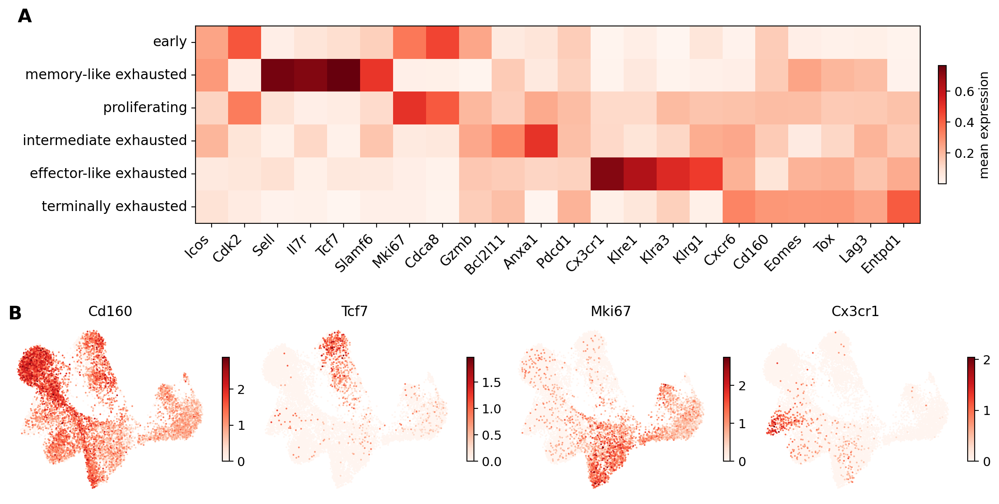

In [9]:
# Figure 2
cmap_exp = "Reds"

fig, axs = make_grid((12, 6), {"nrows": 2, "ncols": 1, "row_heights": [1, 1], "col_widths": [1],
                               "sub_grids": [
                                   None,
                                   {"nrows": 1, "ncols": 4, "row_heights": [1], "col_widths": [1, 1, 1, 1]}
                               ], "hspace": .2})

# mean expression heatmap
sns.heatmap(matrixplot_df, cmap=cmap_exp, ax=axs[0], square=True, cbar=False)
axs[0].set_xticklabels(axs[0].get_xticklabels(), rotation=45, fontsize=12, ha="right")
axs[0].set_yticklabels(axs[0].get_yticklabels(), fontsize=12)
for _, spine in axs[0].spines.items():
    spine.set_visible(True)
plt.colorbar(axs[0].get_children()[0], ax=axs[0], ticks=[0, .2, .4, .6, .8], label="mean expression",
             shrink=.6, aspect=15, pad=.02)

# expression of selected marker genes on UMAP
for i, gene in enumerate(["Cd160", "Tcf7", "Mki67", "Cx3cr1"]):
    sc.pl.umap(adata, color=gene, ax=axs[i+1], cmap=cmap_exp, layer="log1p",
               frameon=False, show=False, colorbar_loc=None)
    plt.colorbar(axs[i+1].get_children()[0], ax=axs[i+1], shrink=.6, aspect=15)
    
axs[0].text(-.245, 1.0, "A", transform=axs[0].transAxes, **axlab_kws)
axs[1].text(0, 1.0, "B", transform=axs[1].transAxes, **axlab_kws)
fig.savefig(os.path.join(FIGURE_PATH, "fig_02.svg"));

In [10]:
adata.obs[["average_step_exh", "average_step_mem"]] = adata.uns["trajectories"]["step_time"].T
adata.obs[["fate_prob_exh", "fate_prob_mem"]] = adata.uns["trajectories"]["cell_fate_probability"].T
coords_exh = adata.uns["trajectories"]["trajectories_coordinates"]["0"]["trajectory_0_coordinates"]
coords_mem = adata.uns["trajectories"]["trajectories_coordinates"]["3"]["trajectory_0_coordinates"]

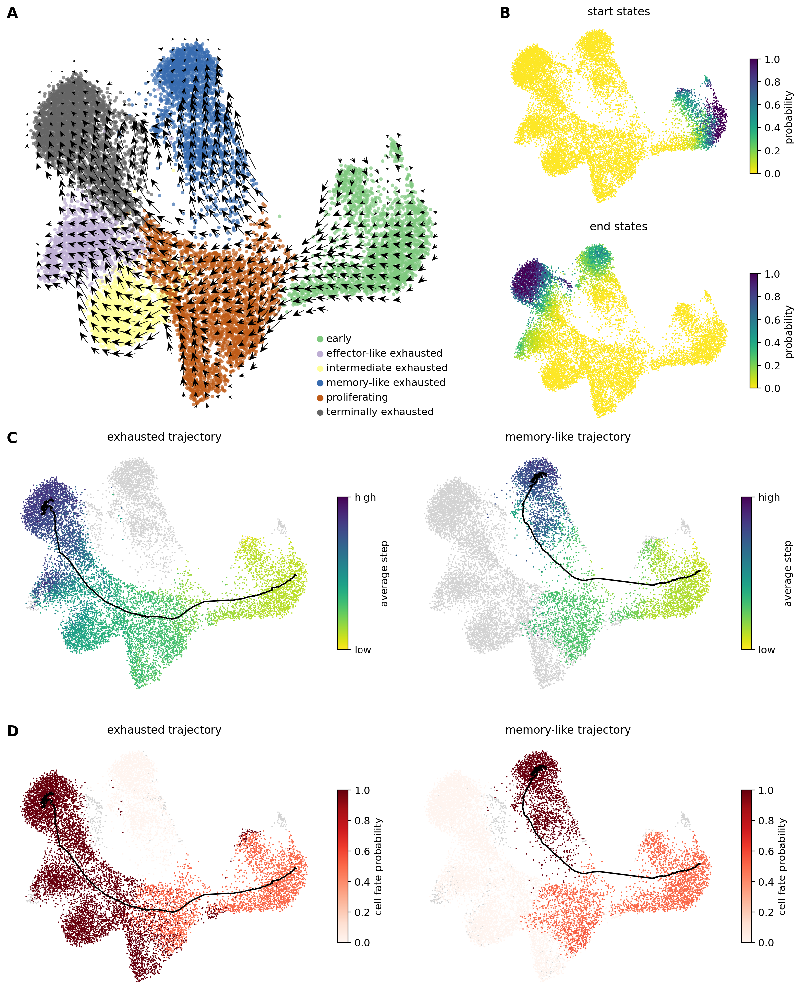

In [11]:
# Figure 3
fig, axs = make_grid((12, 15), {"nrows": 2, "ncols": 1, "row_heights": [1.5, 2], "col_widths": [1],
                                "sub_grids": [
                                    {"nrows": 1, "ncols": 2, "row_heights": [1], "col_widths": [1.5, 1],
                                     "sub_grids": [
                                         None,
                                         {"nrows": 2, "ncols": 1, "row_heights": [1, 1], "col_widths": [1]}
                                     ], "wspace": .2},
                                    {"nrows": 2, "ncols": 2, "row_heights": [1, 1], "col_widths": [1, 1],
                                     "wspace": .05, "hspace": .05}
                                ], "hspace": .2})

# velocity plots
scv.pl.velocity_embedding_grid(adata, color="annotation", ax=axs[0], show=False,
                               legend_loc="right margin", legend_fontsize=12, density=.7,
                               arrow_size=3, arrow_length=3, arrow_color="k", title="", alpha=.7)
axs[0].legend(loc="lower right", frameon=False)

sc.pl.umap(adata, color="root_cells", cmap="viridis_r", ax=axs[1], show=False,
           colorbar_loc=None, title="start states")
plt.colorbar(axs[1].get_children()[0], ax=axs[1], shrink=.6, aspect=15, label="probability")

sc.pl.umap(adata, color="end_points", cmap="viridis_r", ax=axs[2], show=False,
           colorbar_loc=None, title="end states")
plt.colorbar(axs[2].get_children()[0], ax=axs[2], shrink=.6, aspect=15, label="probability")

# Cytopath plots
sc.pl.umap(adata, color="average_step_exh", cmap="viridis_r", ax=axs[3], show=False,
           title="exhausted trajectory", colorbar_loc=None)
cbar = plt.colorbar(axs[3].get_children()[0], ax=axs[3], shrink=.6, aspect=15, label="average step",
                    ticks=[adata.obs.average_step_exh.min(), adata.obs.average_step_exh.max()])
cbar.ax.set_yticklabels(["low", "high"])
axs[3].plot(coords_exh[:, 0], coords_exh[:, 1], color="k")

sc.pl.umap(adata, color="average_step_mem", cmap="viridis_r", ax=axs[4], show=False,
           title="memory-like trajectory", colorbar_loc=None)
cbar = plt.colorbar(axs[4].get_children()[0], ax=axs[4], shrink=.6, aspect=15, label="average step",
                    ticks=[adata.obs.average_step_mem.min(), adata.obs.average_step_mem.max()])
cbar.ax.set_yticklabels(["low", "high"])
axs[4].plot(coords_mem[:, 0], coords_mem[:, 1], color="k")

sc.pl.umap(adata, color="fate_prob_exh", cmap="Reds", ax=axs[5], show=False,
           title="exhausted trajectory", colorbar_loc=None)
plt.colorbar(axs[5].get_children()[0], ax=axs[5], shrink=.6, aspect=15, label="cell fate probability")
axs[5].plot(coords_exh[:, 0], coords_exh[:, 1], color="k")

sc.pl.umap(adata, color="fate_prob_mem", cmap="Reds", ax=axs[6], show=False,
           title="memory-like trajectory", colorbar_loc=None)
plt.colorbar(axs[6].get_children()[0], ax=axs[6], shrink=.6, aspect=15, label="cell fate probability")
axs[6].plot(coords_mem[:, 0], coords_mem[:, 1], color="k")

for i, lab in zip([0, 1, 3, 5], ["A", "B", "C", "D"]):
    axs[i].text(0, 1.0, lab, transform=axs[i].transAxes, **axlab_kws)

fig.savefig(os.path.join(FIGURE_PATH, "fig_03.svg"));

In [12]:
adata.obs["fate_potential"] = stats.entropy(adata.obs[["fate_prob_mem", "fate_prob_exh"]], axis=1)

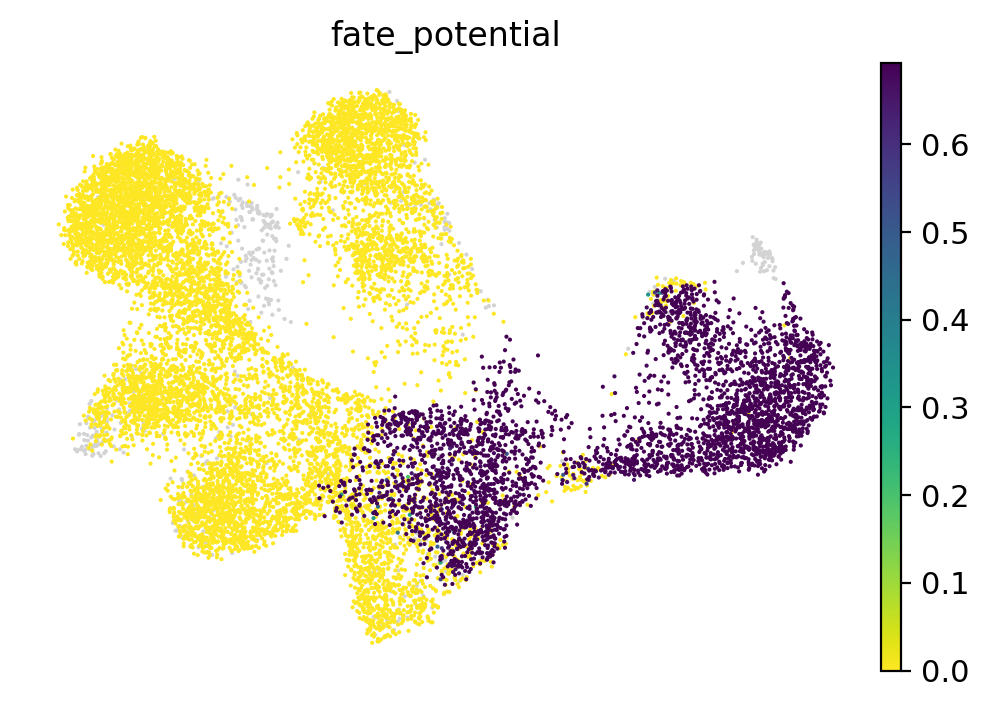

In [13]:
sc.pl.umap(adata, color="fate_potential", cmap="viridis_r")

<Axes: xlabel='timepoint', ylabel='ratio_0'>

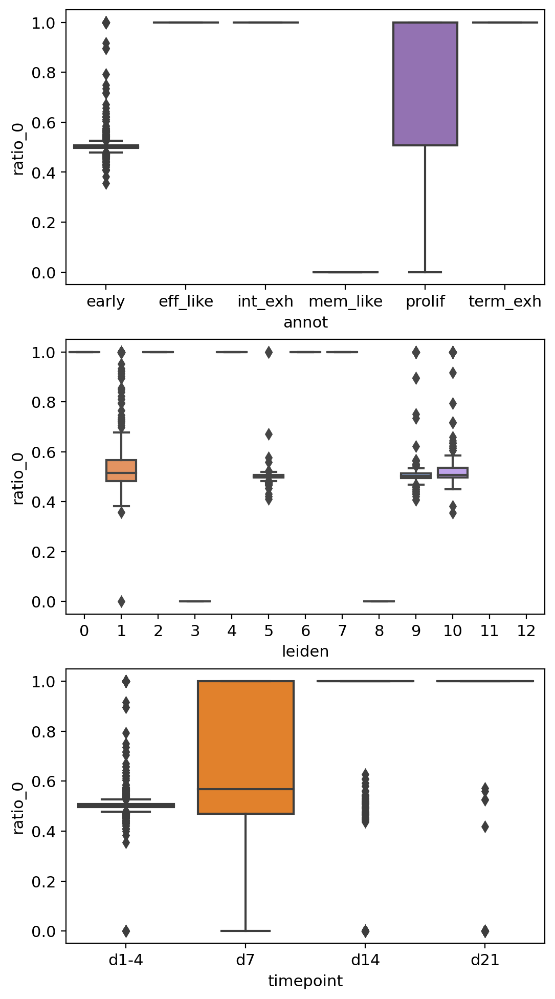

In [14]:
fig, axs = plt.subplots(3, 1, figsize=(6, 12))
sns.boxplot(data=adata.obs, x="annot", y="ratio_0", ax=axs[0])
sns.boxplot(data=adata.obs, x="leiden", y="ratio_0", ax=axs[1])
sns.boxplot(data=adata.obs, x="timepoint", y="ratio_0", ax=axs[2])

<Axes: xlabel='timepoint', ylabel='fate_potential'>

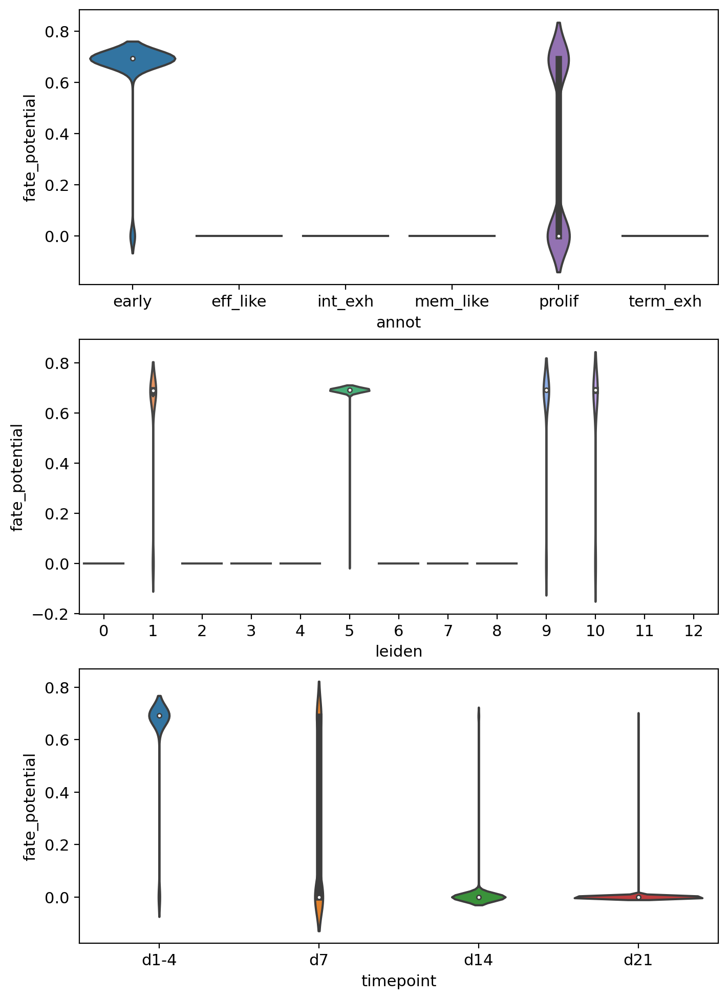

In [15]:
fig, axs = plt.subplots(3, 1, figsize=(8, 12))
sns.violinplot(data=adata.obs, x="annot", y="fate_potential", ax=axs[0])
sns.violinplot(data=adata.obs, x="leiden", y="fate_potential", ax=axs[1])
sns.violinplot(data=adata.obs, x="timepoint", y="fate_potential", ax=axs[2])

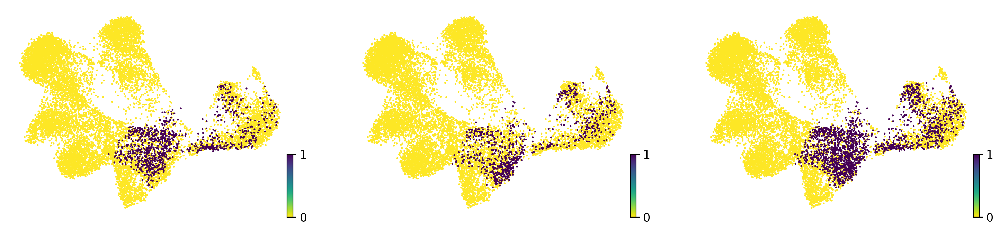

In [16]:
scv.pl.umap(adata, color=[((adata.obs.fate_prob_exh > .51) & (adata.obs.fate_prob_exh < .99)),
                          ((adata.obs.fate_prob_mem > .51) & (adata.obs.fate_prob_mem < .99)),
                          ((adata.obs.fate_potential < stats.entropy([0.49, 0.51])) &
                           (adata.obs.fate_potential > 0))])

In [17]:
def label_point(x, y, val, ax, x_offset=.01, y_offset=0, ha="left"):
    a = pd.concat({'x': x, 'y': y, 'val': val}, axis=1)
    for i, point in a.iterrows():
        ax.text(point['x'] + x_offset, point['y'] + y_offset, str(point['val']), size=12, ha=ha)

In [18]:
stats.entropy([0.49, 0.51])

0.6929471672244782

In [19]:
# Compute correlation of gene expression with fate alignment
cytopath_df = pd.DataFrame.from_records(adata.uns["trajectories"]["cells_along_trajectories"])
cytopath_df = cytopath_df.drop(columns="Trajectory").pivot(columns="End point", index="Cell")\
    .reindex(np.arange(adata.shape[0])).set_index(adata.obs.index.copy())
cytopath_df["sampleID"] = adata.obs.sampleID.copy()
cytopath_df = cytopath_df[cytopath_df.sampleID.isin(["0"])]

adata_early = adata[adata.obs.sampleID.isin(["0", "1"])]

exp_df_early = adata_early.to_df(layer="log1p")
print(f"Calculating correlations for {exp_df_early.shape[0]} early sample T cells")
corrs = pd.DataFrame(index=exp_df_early.columns, columns=["corr_exh", "p_exh", "corr_mem", "p_mem"])
corrs[["corr_exh", "p_exh"]] = exp_df_early.corrwith(adata.obs.fate_prob_exh, #cytopath_df[("Allignment Score", "0")],
                                                     method=lambda x, y:
                                                     stats.spearmanr(x, y, nan_policy="omit")).T
corrs[["corr_mem", "p_mem"]] = exp_df_early.corrwith(adata.obs.fate_prob_mem, #cytopath_df[("Allignment Score", "3")],
                                                     method=lambda x, y:
                                                     stats.spearmanr(x, y, nan_policy="omit")).T

corrs["p"] = corrs[["p_exh", "p_mem"]].min(axis=1)
corrs = corrs[~corrs.p.isna()]
corrs["p_adj"] = multipletests(corrs["p"], method="fdr_bh")[1]
corrs.loc[corrs.p == 0, "p_adj"] = corrs.loc[corrs.p != 0, "p_adj"].min() # replacing 0 p-values with min for log

Calculating correlations for 5825 early sample T cells


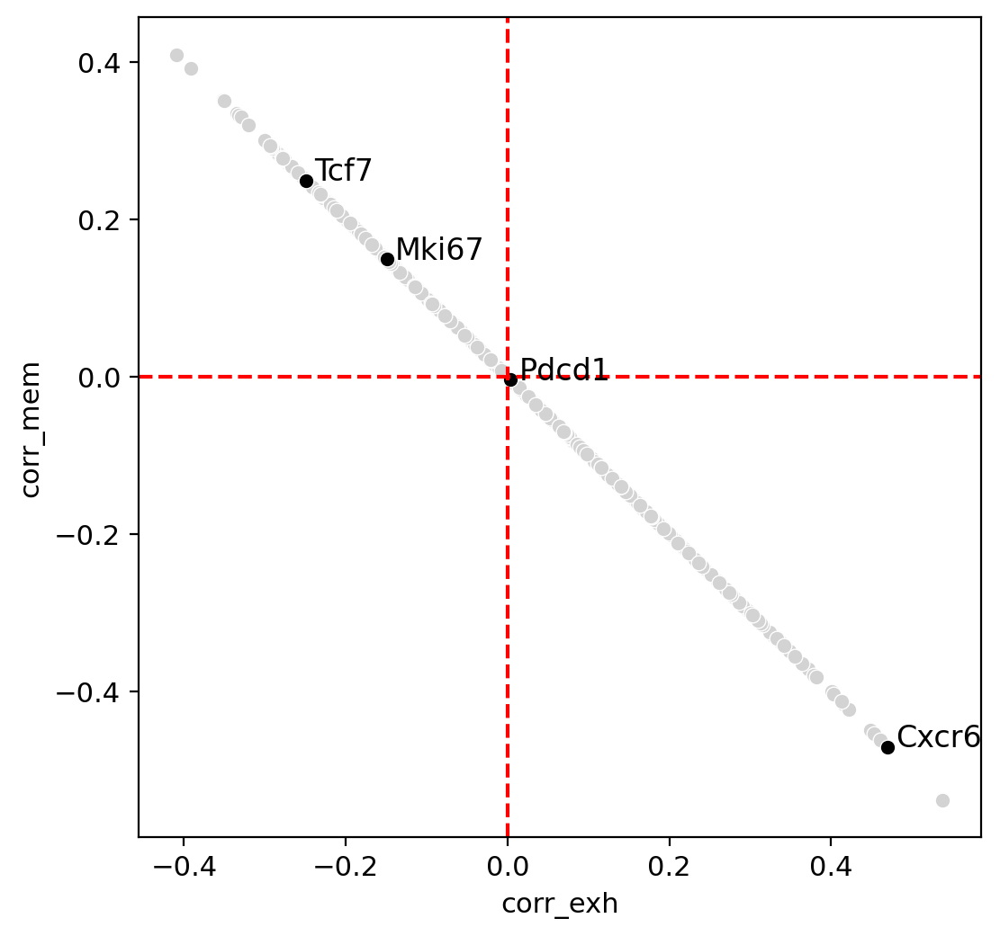

In [20]:
fig, ax = plt.subplots(figsize=(6, 6))
sns.scatterplot(data=corrs, x="corr_exh", y="corr_mem", ax=ax, color="lightgrey")
var_data = corrs.loc[["Cxcr6", "Tcf7", "Pdcd1", "Mki67"]].reset_index(inplace=False)
sns.scatterplot(data=var_data, x="corr_exh", y="corr_mem", ax=ax, color="k")
label_point(var_data["corr_exh"],
            var_data["corr_mem"],
            var_data["index"], ax=ax)
ax.axhline(0, color="red", linestyle="--")
ax.axvline(0, color="red", linestyle="--")

In [21]:
var_data = corrs.loc[["Cxcr6", "Tcf7", "Pdcd1", "Mki67"]].reset_index(inplace=False)
var_data

,index,corr_exh,p_exh,corr_mem,p_mem,p,p_adj
0,Cxcr6,0.470116,7.554134e-309,-0.470116,7.554134e-309,7.554134e-309,2.707402e-305
1,Tcf7,-0.249123,1.013864e-80,0.249123,1.013864e-80,1.013864e-80,6.856015e-79
2,Pdcd1,0.003822,7.738662e-01,-0.003822,7.738662e-01,7.738662e-01,7.988154e-01
3,Mki67,-0.149123,1.791815e-29,0.149123,1.791815e-29,1.791815e-29,1.891565e-28


<Axes: xlabel='End point', ylabel='Allignment Score'>

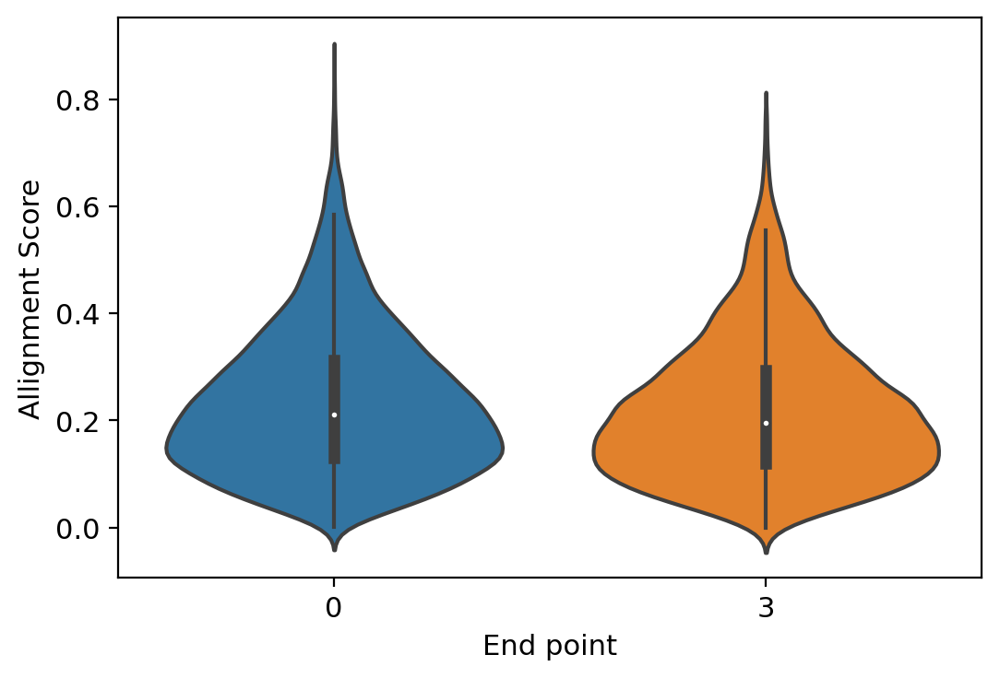

In [22]:
cytopath_df = pd.DataFrame.from_records(adata.uns["trajectories"]["cells_along_trajectories"])
sns.violinplot(data=cytopath_df, x="End point", y="Allignment Score")

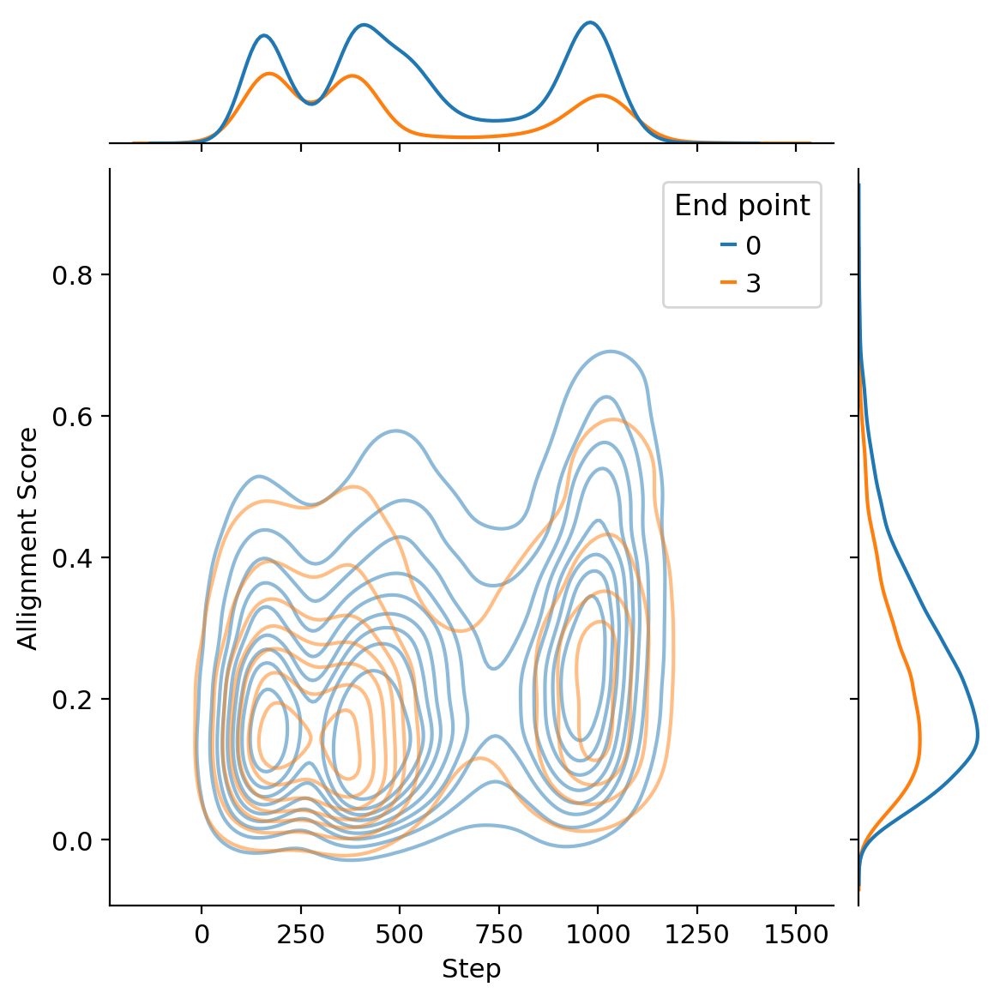

In [23]:
sns.jointplot(data=cytopath_df, x="Step", y="Allignment Score", hue="End point", alpha=.5, kind="kde")

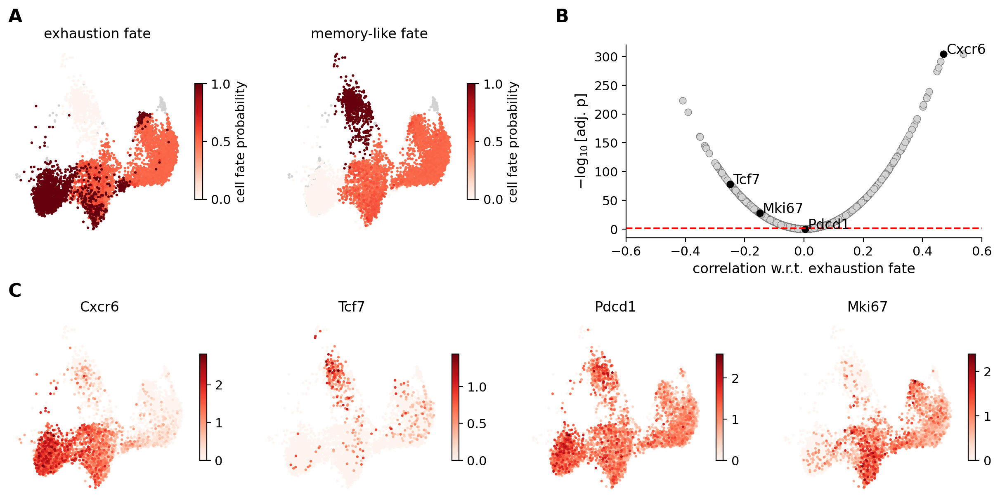

In [24]:
# Figure 4
fig, axs = make_grid((12, 6), {"nrows": 2, "ncols": 1, "row_heights": [1, .8], "col_widths": [1],
                               "sub_grids": [
                                   {"nrows": 1, "ncols": 3, "row_heights": [1], "col_widths": [1, 1, 2],
                                    "wspace": .1},
                                   {"nrows": 1, "ncols": 4, "row_heights": [1], "col_widths": [1, 1, 1, 1],
                                    "wspace": .15}
                               ]})

# expression of fate markers
sc.pl.umap(adata_early, color="fate_prob_exh", cmap="Reds", ax=axs[0], show=False,
           title="exhaustion fate", colorbar_loc=None)
plt.colorbar(axs[0].get_children()[0], ax=axs[0], shrink=.6, aspect=15,
             ticks=[0, .5, 1], label="cell fate probability")
axs[0].text(0, 1.1, "A", transform=axs[0].transAxes, **axlab_kws)

sc.pl.umap(adata_early, color="fate_prob_mem", cmap="Reds", ax=axs[1], show=False,
           title="memory-like fate", colorbar_loc=None)
plt.colorbar(axs[1].get_children()[0], ax=axs[1], shrink=.6, aspect=15,
             ticks=[0, .5, 1], label="cell fate probability")

# marker correlation with fate
min_p = corrs.loc[corrs.p_adj > 0, "p_adj"].min()
sns.scatterplot(x=corrs["corr_exh"], y=-np.log10(corrs["p_adj"]), color="lightgrey", edgecolor="grey", ax=axs[2])
var_data = corrs.loc[["Cxcr6", "Tcf7", "Pdcd1", "Mki67"]].reset_index(inplace=False)
sns.scatterplot(x=var_data["corr_exh"],
                y=-np.log10(var_data["p_adj"]),
                color="black", edgecolor="black", ax=axs[2])
label_point(var_data["corr_exh"],
            -np.log10(var_data["p_adj"]),
            var_data["index"], ax=axs[2])
axs[2].set_xlim(-.6, .6)
axs[2].axhline(-np.log10(.05), ls="--", c="r")
axs[2].set_xlabel(r"correlation w.r.t. exhaustion fate", fontsize=12)
axs[2].set_ylabel(r"$-\log_{10}$[adj. p]", fontsize=12)
sns.despine(ax=axs[2])
axs[2].text(-.2, 1.1, "B", transform=axs[2].transAxes, **axlab_kws)

for i, g in enumerate(var_data["index"]):
    sc.pl.umap(adata_early, color=g, ax=axs[i+3], cmap=cmap_exp, layer="log1p",
               frameon=False, show=False, colorbar_loc=None)
    plt.colorbar(axs[i+3].get_children()[0], ax=axs[i+3], shrink=.6, aspect=15)
axs[3].text(0, 1.1, "C", transform=axs[3].transAxes, **axlab_kws)

fig.savefig(os.path.join(FIGURE_PATH, "fig_04.svg"));

In [25]:
adata.uns.keys()

dict_keys(['T_forward', 'annot_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'phase_colors', 'rank_genes_groups', 'recover_dynamics', 'run_info', 'sampleID_colors', 'samples', 'trajectories', 'umap', 'velocity_graph', 'velocity_graph_neg', 'velocity_params', 'timepoint_colors', 'annotation_colors'])

In [26]:
var_data

,index,corr_exh,p_exh,corr_mem,p_mem,p,p_adj
0,Cxcr6,0.470116,7.554134e-309,-0.470116,7.554134e-309,7.554134e-309,2.707402e-305
1,Tcf7,-0.249123,1.013864e-80,0.249123,1.013864e-80,1.013864e-80,6.856015e-79
2,Pdcd1,0.003822,7.738662e-01,-0.003822,7.738662e-01,7.738662e-01,7.988154e-01
3,Mki67,-0.149123,1.791815e-29,0.149123,1.791815e-29,1.791815e-29,1.891565e-28


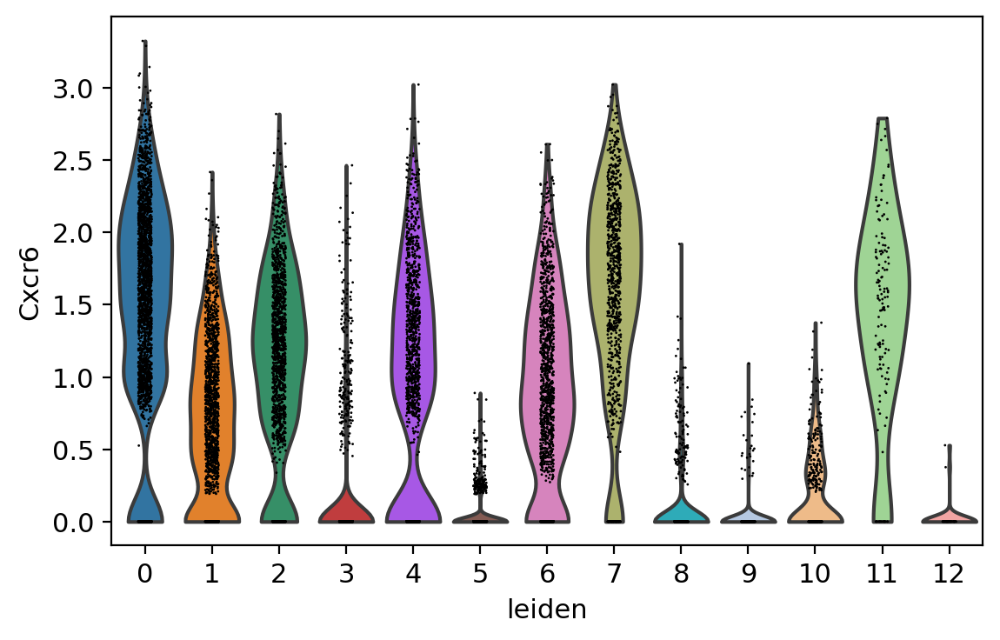

In [27]:
sc.pl.violin(adata, keys="Cxcr6", layer="log1p", groupby="leiden")

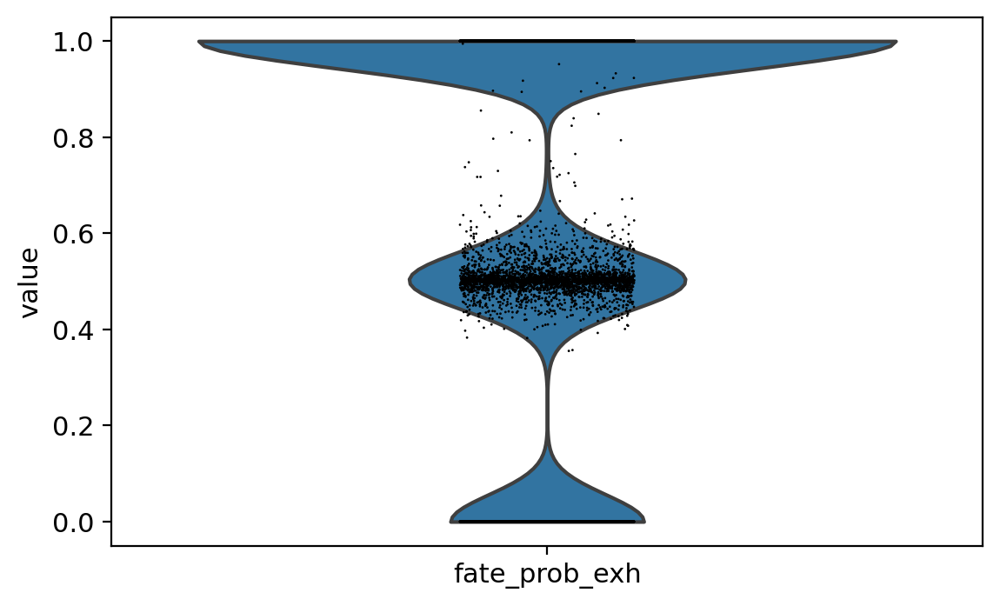

In [28]:
sc.pl.violin(adata, keys="fate_prob_exh")

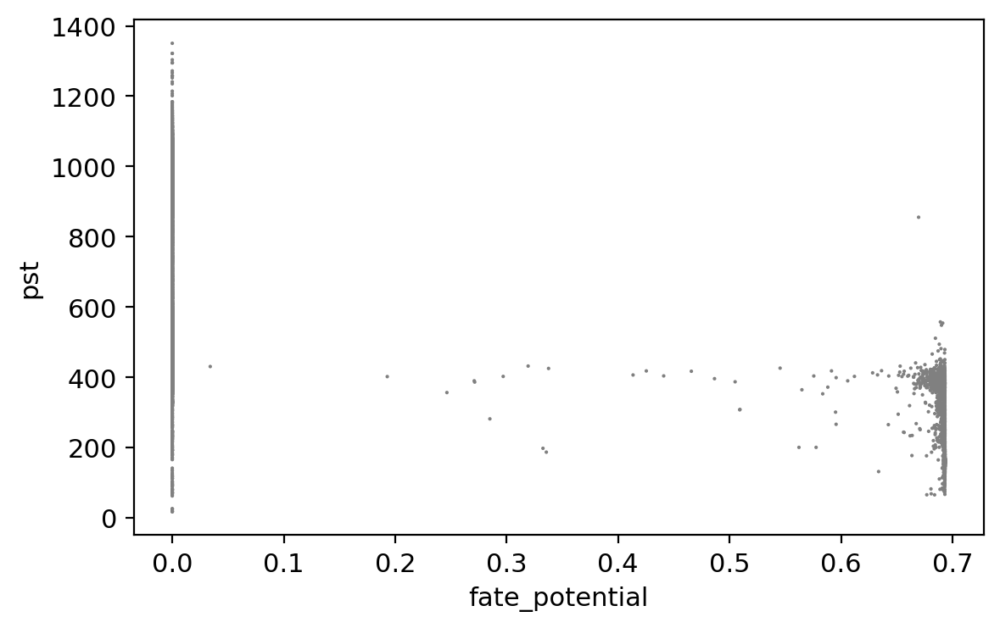

In [29]:
sc.pl.scatter(adata, x="fate_potential", y="pst")

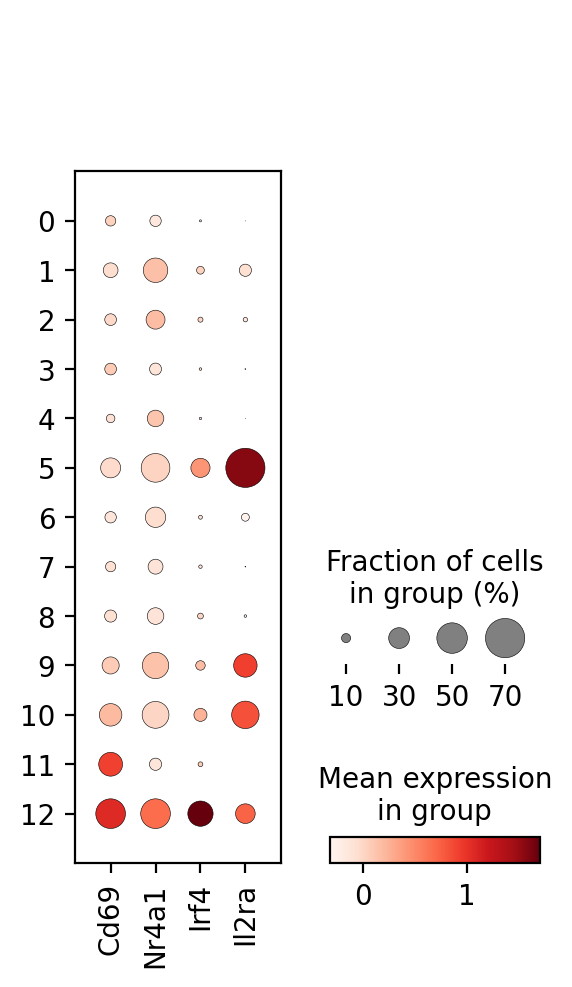

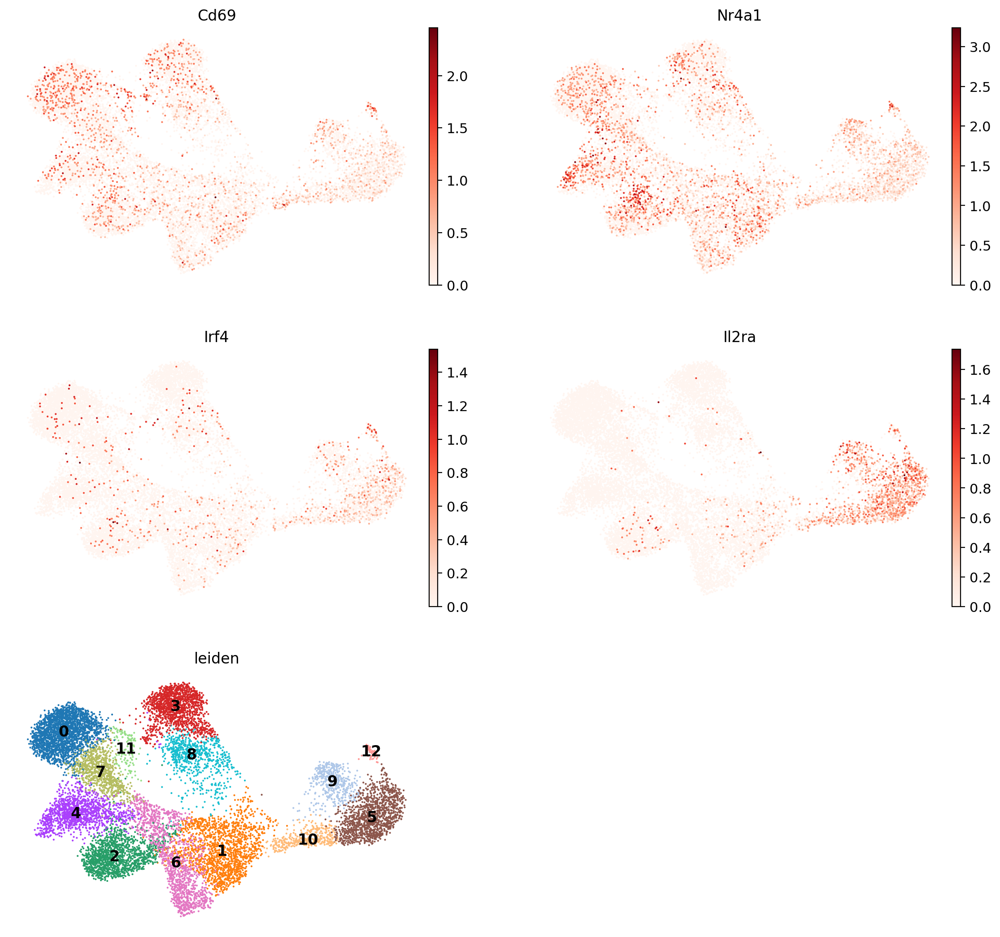

In [30]:
# CD69, Nur77 (Nr4a1) and IRF4 are early activation markers, CD25 (Il2ra) later
activation_markers = [g for g in ["Cd69", "Nr4a1", "Irf4", "Il2ra"] if g in adata.var_names]

sc.pl.dotplot(adata, var_names=activation_markers, groupby="leiden")
sc.pl.umap(adata, color=activation_markers+["leiden"], layer="log1p", legend_loc="on data", cmap="Reds", ncols=2)

In [31]:
adata.obs.annot.cat.categories

Index(['early', 'eff_like', 'int_exh', 'mem_like', 'prolif', 'term_exh'], dtype='object')

In [32]:
adata.obs["annotation_"] = adata.obs.annot.map({"early": "early",
                                                "eff_like": "effector-like\nexhausted",
                                                "int_exh": "intermediate\nexhausted",
                                                "mem_like": "memory-like\nexhausted",
                                                "prolif": "proliferating",
                                                "term_exh": "terminally\nexhausted"}).astype("category")
adata.uns["annotation__colors"] = adata.uns["annotation_colors"]
adata.obs.annotation_.cat.categories

Index(['early', 'effector-like\nexhausted', 'intermediate\nexhausted',
       'memory-like\nexhausted', 'proliferating', 'terminally\nexhausted'],
      dtype='object')

In [33]:
# fontsize = 18

# fig, axs = plt.subplots(1, 3, figsize=(18, 4))

# sc.pl.umap(adata, color="annotation_", ax=axs[0], show=False, legend_fontsize=fontsize)
# axs[0].set_title("T cell subsets", fontsize=fontsize)

# sc.pl.umap(adata, color="average_step_exh", cmap="viridis_r", ax=axs[1], show=False,
#            colorbar_loc=None)
# axs[1].set_title("exhausted trajectory", fontsize=fontsize)
# cbar = plt.colorbar(axs[1].get_children()[0], ax=axs[1], shrink=.6, aspect=15, label="average step",
#                     ticks=[adata.obs.average_step_exh.min(), adata.obs.average_step_exh.max()])
# cbar.ax.set_yticklabels(["low", "high"], fontsize=fontsize)
# cbar.ax.set_ylabel("average step", fontsize=fontsize)
# axs[1].plot(coords_exh[:, 0], coords_exh[:, 1], color="k")

# sc.pl.umap(adata, color="average_step_mem", cmap="viridis_r", ax=axs[2], show=False,
#            colorbar_loc=None)
# axs[2].set_title("memory-like trajectory", fontsize=fontsize)
# cbar = plt.colorbar(axs[2].get_children()[0], ax=axs[2], shrink=.6, aspect=15, label="average step",
#                     ticks=[adata.obs.average_step_mem.min(), adata.obs.average_step_mem.max()])
# cbar.ax.set_yticklabels(["low", "high"], fontsize=fontsize)
# cbar.ax.set_ylabel("average step", fontsize=fontsize)
# axs[2].plot(coords_mem[:, 0], coords_mem[:, 1], color="k")

# fig.tight_layout()
# fig.savefig("tex_trajectories.svg");